In [1]:
#Importing the required libraries
import numpy as np #for linear algebra/data preprocessing
import pandas as pd #for data preprocessing
import matplotlib.pyplot as plt #For visualization
import seaborn as sns #for visualization
from pandas_profiling import ProfileReport
%matplotlib inline

In [2]:
data_train= pd.read_csv("train.csv")

data_test= pd.read_csv("test.csv")


In [3]:
data_train.head()

,patient_id_,HAEMATOCRIT,HAEMOGLOBINS,ERYTHROCYTE,LEUCOCYTE,THROMBOCYTE,MCH,MCHC,MCV,AGE,SEX,SOURCE
0,patient_id_1270,43.6,14.5,5.52,3.0,237,27.5,33.6,81.7,32,F,0
1,patient_id_1762,44.3,14.4,5.09,7.3,255,29.7,32.9,90.4,40,M,0
2,patient_id_3355,36.2,12.5,4.57,7.8,263,28.9,35.0,82.6,65,F,0
3,patient_id_2443,46.1,14.7,5.38,8.5,320,28.6,32.2,88.8,52,M,0
4,patient_id_3414,31.8,10.9,4.05,26.9,220,28.6,34.8,82.3,66,F,1


In [4]:
data_test.head()

,patient_id_,HAEMATOCRIT,HAEMOGLOBINS,ERYTHROCYTE,LEUCOCYTE,THROMBOCYTE,MCH,MCHC,MCV,AGE,SEX
0,patient_id_4373,33.0,11.1,4.15,11.1,329,28.4,34.1,83.2,89,F
1,patient_id_2204,34.0,11.1,4.23,9.7,120,27.9,33.1,84.1,47,F
2,patient_id_93,42.4,14.1,5.71,4.3,239,25.8,33.6,76.7,3,M
3,patient_id_798,40.3,13.4,5.19,4.7,208,27.1,33.7,80.5,25,F
4,patient_id_789,33.3,11.4,4.28,7.5,206,28.3,34.7,81.3,25,F


In [5]:
data_train.profile_report()  

0    1822
1    1266
Name: SOURCE, dtype: int64



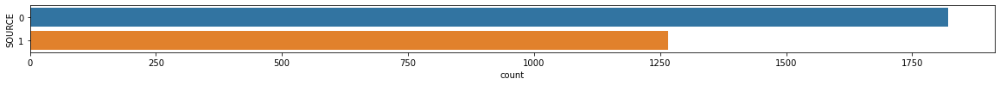

In [6]:
print(data_train.SOURCE.value_counts())
print()

plt.figure(figsize=(20,1))
sns.countplot(y= 'SOURCE',data=data_train)
plt.show()

In [7]:
data_train.dtypes

patient_id_      object
HAEMATOCRIT     float64
HAEMOGLOBINS    float64
ERYTHROCYTE     float64
LEUCOCYTE       float64
THROMBOCYTE       int64
MCH             float64
MCHC            float64
MCV             float64
AGE               int64
SEX              object
SOURCE            int64
dtype: object

In [8]:
df=data_train.drop(['patient_id_'],axis=1)
data_test.drop(['patient_id_'], axis=1, inplace=True)  

In [9]:
df.head()

,HAEMATOCRIT,HAEMOGLOBINS,ERYTHROCYTE,LEUCOCYTE,THROMBOCYTE,MCH,MCHC,MCV,AGE,SEX,SOURCE
0,43.6,14.5,5.52,3.0,237,27.5,33.6,81.7,32,F,0
1,44.3,14.4,5.09,7.3,255,29.7,32.9,90.4,40,M,0
2,36.2,12.5,4.57,7.8,263,28.9,35.0,82.6,65,F,0
3,46.1,14.7,5.38,8.5,320,28.6,32.2,88.8,52,M,0
4,31.8,10.9,4.05,26.9,220,28.6,34.8,82.3,66,F,1


In [10]:
data_test.head()

,HAEMATOCRIT,HAEMOGLOBINS,ERYTHROCYTE,LEUCOCYTE,THROMBOCYTE,MCH,MCHC,MCV,AGE,SEX
0,33.0,11.1,4.15,11.1,329,28.4,34.1,83.2,89,F
1,34.0,11.1,4.23,9.7,120,27.9,33.1,84.1,47,F
2,42.4,14.1,5.71,4.3,239,25.8,33.6,76.7,3,M
3,40.3,13.4,5.19,4.7,208,27.1,33.7,80.5,25,F
4,33.3,11.4,4.28,7.5,206,28.3,34.7,81.3,25,F


(10.1, -0.1)

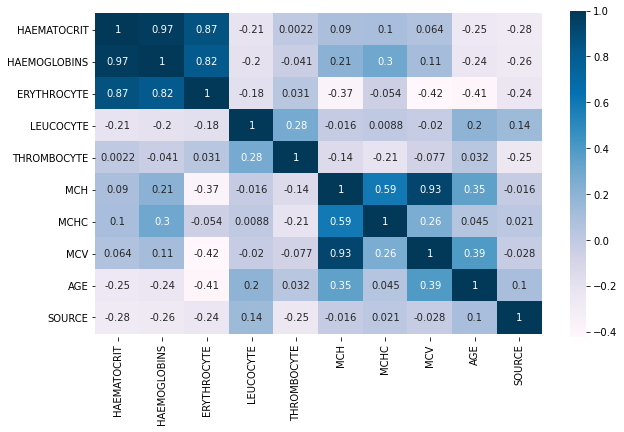

In [11]:
plt.figure(figsize=(10,6))
ax = sns.heatmap(df.corr(), annot = True, cmap='PuBu')
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.1, top - 0.1)  

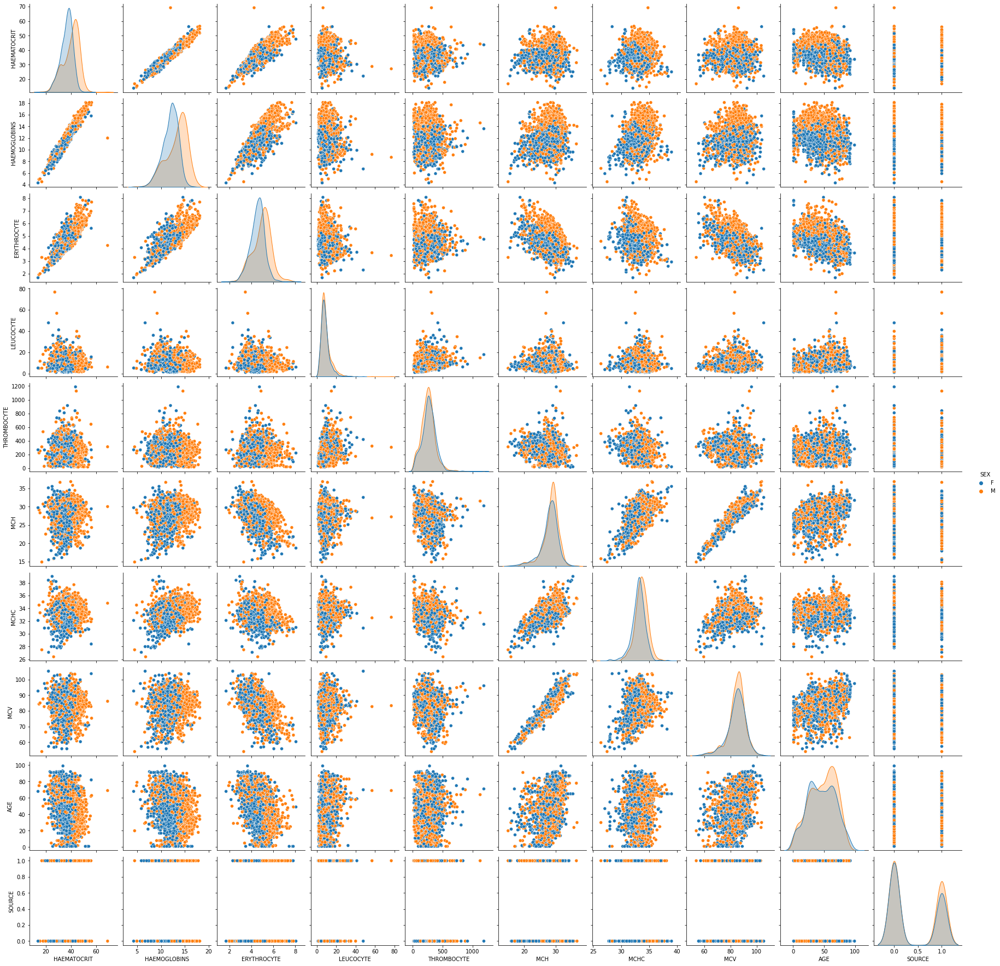

In [12]:
sns.pairplot(data=df,hue = 'SEX');  

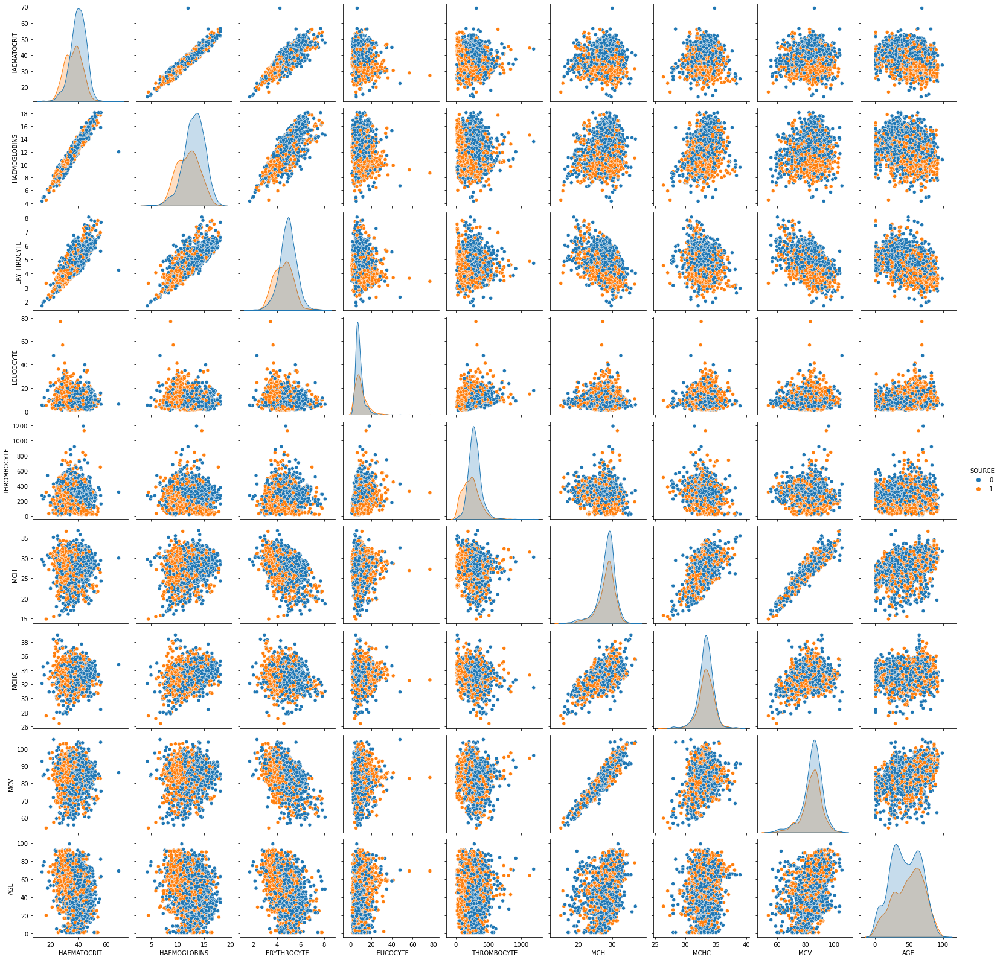

In [13]:
sns.pairplot(data=df,hue = 'SOURCE'); 

In [14]:
from sklearn.preprocessing import LabelEncoder
le= LabelEncoder()

cat_col= ['SEX']
for col in cat_col:
    df[col]= le.fit_transform(df[col])
    data_test[col]= le.fit_transform(data_test[col]) 

In [15]:
X= df.drop('SOURCE', axis=1)
y= df['SOURCE'] 

In [16]:
from sklearn import metrics 
from sklearn.model_selection import train_test_split 

In [17]:
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.20,random_state=42)

In [18]:
from sklearn.ensemble import GradientBoostingClassifier
GBC=GradientBoostingClassifier()

In [19]:
GBC.fit(X_train,y_train)

GradientBoostingClassifier()

In [20]:
GBC_prediction=GBC.predict(X_test)

In [21]:
def ConfusionMatrix(ytest, ypred, label = ["inpatient", "outpatient"]):
    "A beautiful confusion matrix function to check the model performance"
    from sklearn.metrics import confusion_matrix
    import seaborn as sns
    cm = confusion_matrix(ytest, ypred)
    plt.figure(figsize=(7, 5))
    sns.heatmap(cm, annot = True, cbar = False, fmt = 'd', cmap = 'rainbow')
    plt.xlabel('Predicted', fontsize = 13)
    plt.xticks([0.5, 1.5], label)
    plt.yticks([0.5, 1.5], label)
    plt.ylabel('Truth', fontsize = 13)
    plt.title('A confusion matrix'); 

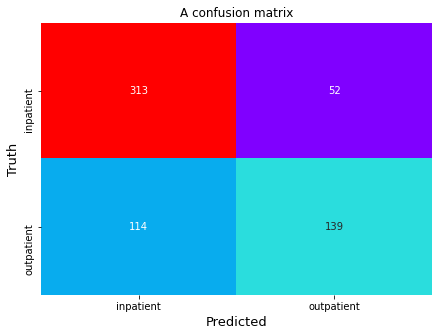

In [22]:
ConfusionMatrix(y_test, GBC_prediction,label = ["inpatient", "outpatient"])

In [23]:
from sklearn.metrics import confusion_matrix,accuracy_score,classification_report

In [24]:
confusionmatrix=confusion_matrix(y_test,GBC_prediction)
confusionmatrix

array([[313,  52],
       [114, 139]], dtype=int64)

In [25]:
print(metrics.classification_report(y_test, GBC_prediction, digits=3, zero_division = 1))

              precision    recall  f1-score   support

           0      0.733     0.858     0.790       365
           1      0.728     0.549     0.626       253

    accuracy                          0.731       618
   macro avg      0.730     0.703     0.708       618
weighted avg      0.731     0.731     0.723       618



In [26]:
cm = confusion_matrix(y_test, GBC_prediction)
accuracyscore=accuracy_score(y_test,GBC_prediction)
accuracyscore
print(accuracyscore*100)

73.13915857605178


In [27]:
test_pred= GBC.predict(data_test)    

In [28]:
# to submit the csv
# submission= pd.read_csv('sample_submission.csv')
# submission.subscribed= test_pred
# submission.head()  

In [29]:
#submission.to_csv('kaggle_submission.csv', index=False)

In [30]:
from pandas.plotting import scatter_matrix
from sklearn import model_selection
from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier

In [31]:
classifier = []
classifier.append(("LogisticReg", LogisticRegression(solver='liblinear',multi_class='ovr')))
classifier.append(("DecisionTree", DecisionTreeClassifier(criterion ='entropy')))
classifier.append(("KNN", KNeighborsClassifier()))
classifier.append(("KernelSVM", SVC(gamma='auto')))
classifier.append(("NaiveBayes", GaussianNB()))
classifier.append(("RandomForest", RandomForestClassifier()))

In [32]:
 seed =0
results = []
names = []
scoring = 'accuracy'
for name, model in classifier:
	kfold = model_selection.KFold(n_splits=10, random_state=seed)
	cv_results = model_selection.cross_val_score(model, X, y, cv=kfold, scoring=scoring)
	results.append(cv_results)
	names.append(name)
	msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
	print(msg)

C:\Users\Hush\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:293: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  warnings.warn(


LogisticReg: 0.725067 (0.020867)


C:\Users\Hush\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:293: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  warnings.warn(


DecisionTree: 0.660301 (0.021878)


C:\Users\Hush\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:293: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  warnings.warn(


KNN: 0.690411 (0.013043)


C:\Users\Hush\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:293: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  warnings.warn(


KernelSVM: 0.620134 (0.016577)
NaiveBayes: 0.690741 (0.023672)


C:\Users\Hush\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:293: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  warnings.warn(
C:\Users\Hush\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:293: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  warnings.warn(


RandomForest: 0.748381 (0.015863)


In [33]:
logreg=LogisticRegression()
logreg.fit(X_train,y_train) 

C:\Users\Hush\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [34]:
predictions=logreg.predict(X_test)
pd.DataFrame(predictions).head(20) 

,0
0,0
1,1
2,1
3,0
4,1
5,1
6,0
7,0
8,0
9,1


In [35]:
y_pred = logreg.predict(X_test) 

In [36]:
print(metrics.classification_report(y_test, y_pred, digits=3, zero_division = 1))

              precision    recall  f1-score   support

           0      0.720     0.858     0.782       365
           1      0.716     0.518     0.601       253

    accuracy                          0.718       618
   macro avg      0.718     0.688     0.692       618
weighted avg      0.718     0.718     0.708       618



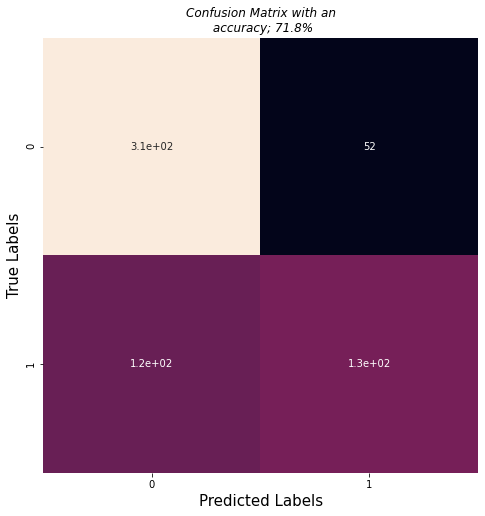

In [37]:
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(12, 8))
ax =sns.heatmap(cm, square=True, annot=True, cbar=False)
ax.set_xlabel('Predicted Labels',fontsize = 15)
ax.set_ylabel('True Labels',fontsize = 15)
plt.title('Confusion Matrix with an\n accuracy; 71.8%',fontstyle='italic')
plt.show()

In [38]:
cm = confusion_matrix(y_test, y_pred)
accuracyscore=accuracy_score(y_test, y_pred)
accuracyscore
print(accuracyscore*100)

71.84466019417476


In [41]:
Rand_forest = RandomForestClassifier(n_jobs=-1,
                               random_state=42, 
                               n_estimators=500,
                               max_features=7,
                               max_depth=30,)

In [42]:
Rand_forest.fit(X_train, y_train)  

RandomForestClassifier(max_depth=30, max_features=7, n_estimators=500,
                       n_jobs=-1, random_state=42)

In [43]:
y_pred = Rand_forest.predict(X_test)
print(metrics.classification_report(y_test, y_pred.round(), digits=3)) 

              precision    recall  f1-score   support

           0      0.741     0.860     0.796       365
           1      0.737     0.565     0.640       253

    accuracy                          0.739       618
   macro avg      0.739     0.713     0.718       618
weighted avg      0.739     0.739     0.732       618



In [44]:
test_pred= GBC.predict(data_test)    
test_pred1=logreg.predict(data_test)   
test_pred2= Rand_forest.predict(data_test)       

In [45]:
submission1 = pd.read_csv("sample_submission.csv")
submission1.SOURCE = test_pred1
submission1.head()

,patient_id_,SOURCE
0,patient_id_4373,0
1,patient_id_2204,1
2,patient_id_93,0
3,patient_id_798,0
4,patient_id_789,1


In [46]:
submission= pd.read_csv('sample_submission.csv')
submission.SOURCE = test_pred
submission.head() 

,patient_id_,SOURCE
0,patient_id_4373,0
1,patient_id_2204,1
2,patient_id_93,0
3,patient_id_798,0
4,patient_id_789,0


In [47]:
submission2= pd.read_csv('sample_submission.csv')
submission2.SOURCE= test_pred2
submission2.head()  

,patient_id_,SOURCE
0,patient_id_4373,1
1,patient_id_2204,1
2,patient_id_93,0
3,patient_id_798,0
4,patient_id_789,0


In [48]:
submission.to_csv('kaggle_submission.csv', index=False)   

In [50]:
 submission1.to_csv('kaggle_submission1.csv', index=False)   

In [53]:
submission2.to_csv('kaggle_submission2.csv', index=False)  